In [1]:
#Library imports
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr

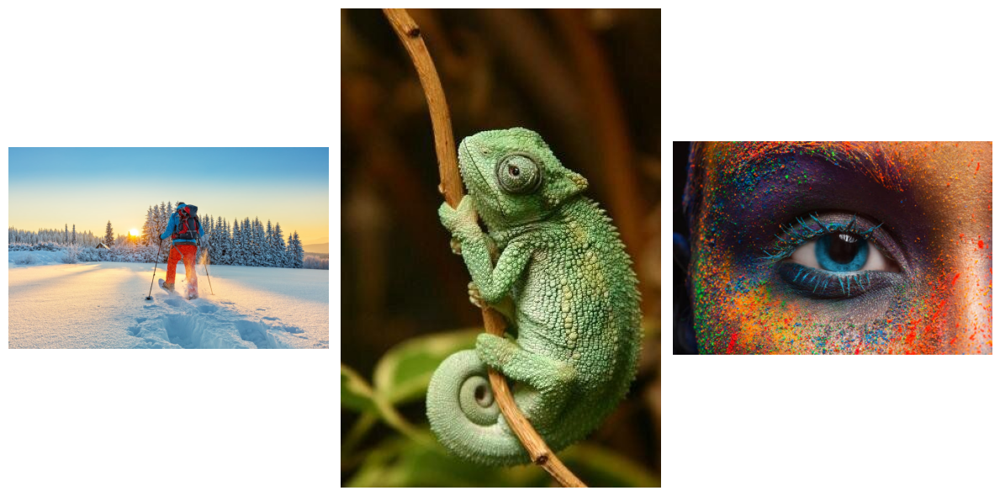

In [2]:
# Load images
img1 = cv2.imread('snowshoe.jpg')
img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread('cham.jpg')
img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img3 = cv2.imread('eye.jpg')
img3_rgb = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.imshow(img1_rgb)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(img2_rgb)
plt.axis('off')
plt.tight_layout()

plt.subplot(1, 3, 3)
plt.imshow(img3_rgb)
plt.axis('off')
plt.tight_layout()

plt.show()

In [3]:
# Define kernels

kernel1 = np.array([
    [-1, -1, -1], 
    [-1, 9, -1], 
    [-1, -1, -1]
    ])

kernel2 = np.array([
    [0, -1, 0], 
    [-1, 5, -1], 
    [0, -1, 0]
    ])

kernel3 = np.ones((5, 5), np.float32) / 25

kernel4 = np.array([
    [1, 1, 1], 
    [1, 1, 1], 
    [1, 1, 1]
    ]) / 9

kernel5 = np.array([
    [1, 4, 6, 4, 1], 
    [4, 16, 24, 16, 4], 
    [6, 24, 36, 24, 6], 
    [4, 16, 24, 16, 4], 
    [1, 4, 6, 4, 1]]) / 256

kernels = [kernel1, kernel2, kernel3, kernel4, kernel5]
kernel_names = ['Sharpen 1', 'Sharpen 2', 'Blur 1', 'Blur 2', 'Gaussian Blur']

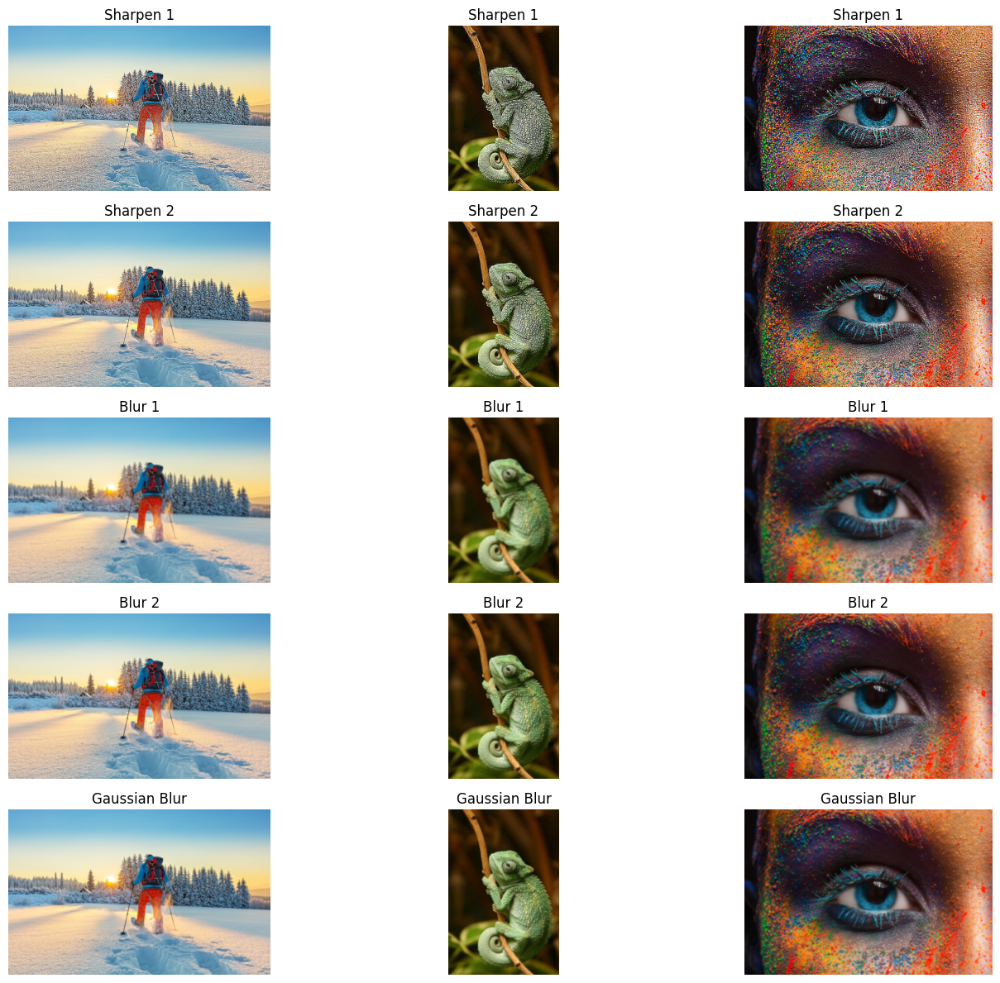

In [4]:
# Apply kernels and display results
plt.figure(figsize=(15, 12))
for i, (kernel, name) in enumerate(zip(kernels, kernel_names)):
    result1 = cv2.filter2D(img1_rgb, -1, kernel)
    result2 = cv2.filter2D(img2_rgb, -1, kernel)
    result3 = cv2.filter2D(img3_rgb, -1, kernel)
    
    plt.subplot(5, 3, 3*i+1)
    plt.imshow(result1)
    plt.title(name)
    plt.axis('off')
    
    plt.subplot(5, 3, 3*i+2)
    plt.imshow(result2)
    plt.title(name)
    plt.axis('off')

    plt.subplot(5, 3, 3*i+3)
    plt.imshow(result3)
    plt.title(name)
    plt.axis('off')

plt.tight_layout()
plt.show()

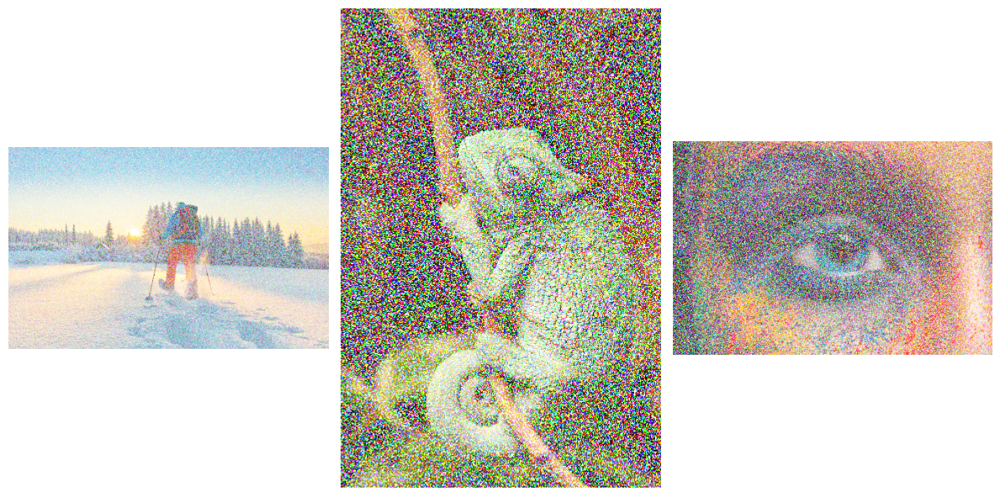

In [5]:
# Add noise to images
noise1 = np.random.normal(0, 5, img1_rgb.shape).astype(np.uint8)
noisy1 = cv2.add(img1_rgb, noise1)

noise2 = np.random.normal(0, 5, img2_rgb.shape).astype(np.uint8)
noisy2 = cv2.add(img2_rgb, noise2)

noise3 = np.random.normal(0, 5, img3_rgb.shape).astype(np.uint8)
noisy3 = cv2.add(img3_rgb, noise3)


plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.imshow(noisy1)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(noisy2)
plt.axis('off')
plt.tight_layout()

plt.subplot(1, 3, 3)
plt.imshow(noisy3)
plt.axis('off')
plt.tight_layout()

plt.show()

In [6]:
def apply_filters(img):
    results = {}
    
    # Blur
    results['Mean'] = cv2.blur(img, (5, 5))
    results['Gaussian'] = cv2.GaussianBlur(img, (5, 5), 0)
    results['Median'] = cv2.medianBlur(img, 5)
    results['Bilateral'] = cv2.bilateralFilter(img, 9, 75, 75)
    
    # Sobel
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    sobel_xy = cv2.Sobel(gray, cv2.CV_64F, 1, 1, ksize=3)
    sobel_combined = np.sqrt(sobel_x**2 + sobel_y**2)
    
    results['Sobel X'] = cv2.cvtColor(np.uint8(np.abs(sobel_x)), cv2.COLOR_GRAY2RGB)
    results['Sobel Y'] = cv2.cvtColor(np.uint8(np.abs(sobel_y)), cv2.COLOR_GRAY2RGB)
    results['Sobel XY'] = cv2.cvtColor(np.uint8(np.abs(sobel_xy)), cv2.COLOR_GRAY2RGB)
    results['Sobel Combined'] = cv2.cvtColor(np.uint8(sobel_combined), cv2.COLOR_GRAY2RGB)
    
    # Laplacian
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)
    results['Laplacian'] = cv2.cvtColor(np.uint8(np.abs(laplacian)), cv2.COLOR_GRAY2RGB)
    
    # Non-Local Means
    nlm = cv2.fastNlMeansDenoisingColored(img, None, 10, 10, 7, 21)
    results['Non-Local Means'] = nlm

    # Box Filter
    results['Box Filter'] = cv2.boxFilter(img, -1, (9, 9))

    # Canny
    canny = cv2.Canny(gray, 100, 200)
    results['Canny'] = cv2.cvtColor(canny, cv2.COLOR_GRAY2RGB)
    
    # Errosion
    kernel = np.ones((5, 5), np.uint8)
    results['Erosion'] = cv2.erode(img, kernel, iterations=1)

    return results

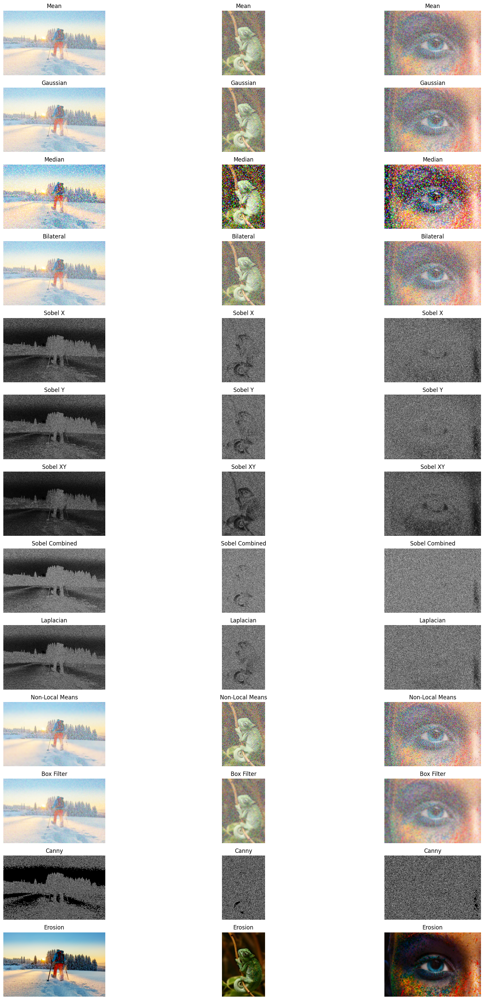

In [7]:
# Apply filters to noisy images
filtered1 = apply_filters(noisy1)
filtered2 = apply_filters(noisy2)
filtered3 = apply_filters(noisy3)

filter_names = list(filtered1.keys())
plt.figure(figsize=(20, 30))

for i, name in enumerate(filter_names):
    plt.subplot(len(filter_names), 3, 3*i+1)
    plt.imshow(filtered1[name])
    plt.title(name)
    plt.axis('off')
    
    plt.subplot(len(filter_names), 3, 3*i+2)
    plt.imshow(filtered2[name])
    plt.title(name)
    plt.axis('off')

    plt.subplot(len(filter_names), 3, 3*i+3)
    plt.imshow(filtered3[name])
    plt.title(name)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [8]:
# Calculate PSNR and SSIM
def calculate_metrics(original, processed):
    psnr_val = psnr(original, processed)
    ssim_val = ssim(original, processed, multichannel=True, channel_axis=2)
    return psnr_val, ssim_val

results1 = {}
results2 = {}
results3 = {}

for name in filter_names:
    psnr1, ssim1 = calculate_metrics(img1_rgb, filtered1[name])
    psnr2, ssim2 = calculate_metrics(img2_rgb, filtered2[name])
    psnr3, ssim3 = calculate_metrics(img3_rgb, filtered3[name])
    
    results1[name] = {'PSNR': psnr1, 'SSIM': ssim1}
    results2[name] = {'PSNR': psnr2, 'SSIM': ssim2}
    results3[name] = {'PSNR': psnr3, 'SSIM': ssim3}

In [9]:
# Display results in a table
import pandas as pd
from IPython.display import display
import warnings
warnings.filterwarnings("ignore")

data = []
for name in filter_names:
    row = [
        results1[name]['PSNR'], results1[name]['SSIM'],
        results2[name]['PSNR'], results2[name]['SSIM'],
        results3[name]['PSNR'], results3[name]['SSIM']
    ]
    data.append(row)

df = pd.DataFrame(data, index=filter_names, 
                  columns=['Image 1 PSNR', 'Image 1 SSIM', 
                           'Image 2 PSNR', 'Image 2 SSIM',
                           'Image 3 PSNR', 'Image 3 SSIM'])

def psnr_color(val):
    norm_val = min(max(val / 50, 0), 1)
    return f'background-color: rgba({255*(1-norm_val)}, {0}, {255*norm_val}, 0.7)'

def ssim_color(val):
    norm_val = min(max((val + 1) / 2, 0), 1) 
    return f'background-color: rgba({255*(1-norm_val)}, {0}, {255*norm_val}, 0.7)'

styled_df = df.style.format("{:.2f}")

for col in [0, 2, 4]:  
    styled_df = styled_df.applymap(psnr_color, subset=df.columns[col])

for col in [1, 3, 5]:
    styled_df = styled_df.applymap(ssim_color, subset=df.columns[col])

display(styled_df)

,Image 1 PSNR,Image 1 SSIM,Image 2 PSNR,Image 2 SSIM,Image 3 PSNR,Image 3 SSIM
Mean,15.29,0.53,8.99,0.16,9.63,0.19
Gaussian,15.23,0.50,8.86,0.16,9.52,0.23
Median,14.60,0.26,8.44,0.12,8.92,0.13
Bilateral,13.40,0.38,5.95,0.09,6.70,0.10
Sobel X,5.24,-0.00,7.59,-0.01,8.06,-0.00
Sobel Y,5.28,0.00,7.58,-0.01,8.02,0.00
Sobel XY,4.44,0.01,8.18,-0.02,8.49,-0.00
Sobel Combined,6.43,0.00,6.97,0.00,7.61,0.01
Laplacian,5.69,-0.02,7.24,-0.02,7.83,-0.01
Non-Local Means,13.72,0.51,5.86,0.09,6.56,0.11


From red (bad) to purple (good) using RGB.

PSNR is normalized to a range on max 50 dB (typical max for PSNR).

SSIM is normalized from [-1, 1] to [0, 1] (SSIM usually ranges from 0 to 1 though).



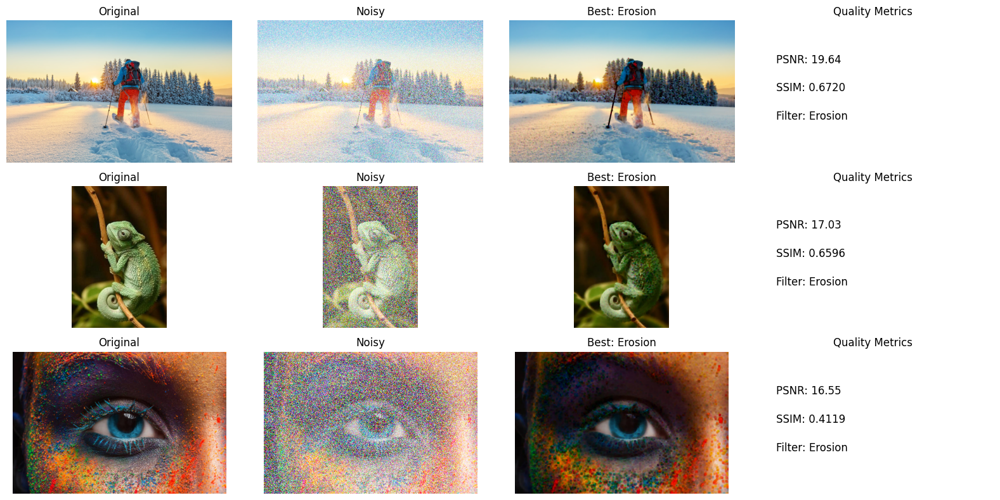

In [10]:
# Display results with best filter
plt.figure(figsize=(16, 8))

plt.subplot(3, 4, 1)
plt.imshow(img1_rgb)
plt.title('Original')
plt.axis('off')

plt.subplot(3, 4, 2)
plt.imshow(noisy1)
plt.title('Noisy')
plt.axis('off')

plt.subplot(3, 4, 3)
plt.imshow(filtered1["Erosion"])
plt.title(f'Best: Erosion')
plt.axis('off')

plt.subplot(3, 4, 4)
plt.text(0.1, 0.7, f'PSNR: {results1["Erosion"]["PSNR"]:.2f}', fontsize=12)
plt.text(0.1, 0.5, f'SSIM: {results1["Erosion"]["SSIM"]:.4f}', fontsize=12)
plt.text(0.1, 0.3, 'Filter: Erosion', fontsize=12)
plt.title('Quality Metrics')
plt.axis('off')

plt.subplot(3, 4, 5)
plt.imshow(img2_rgb)
plt.title('Original')
plt.axis('off')

plt.subplot(3, 4, 6)
plt.imshow(noisy2)
plt.title('Noisy')
plt.axis('off')

plt.subplot(3, 4, 7)
plt.imshow(filtered2["Erosion"])
plt.title('Best: Erosion')
plt.axis('off')

plt.subplot(3, 4, 8)
plt.text(0.1, 0.7, f'PSNR: {results2["Erosion"]["PSNR"]:.2f}', fontsize=12)
plt.text(0.1, 0.5, f'SSIM: {results2["Erosion"]["SSIM"]:.4f}', fontsize=12)
plt.text(0.1, 0.3, 'Filter: Erosion', fontsize=12)
plt.title('Quality Metrics')
plt.axis('off')

plt.subplot(3, 4, 9)
plt.imshow(img3_rgb)
plt.title('Original')
plt.axis('off')

plt.subplot(3, 4, 10)
plt.imshow(noisy3)
plt.title('Noisy')
plt.axis('off')

plt.subplot(3, 4, 11)
plt.imshow(filtered3["Erosion"])
plt.title('Best: Erosion')
plt.axis('off')
plt.subplot(3, 4, 12)
plt.text(0.1, 0.7, f'PSNR: {results3["Erosion"]["PSNR"]:.2f}', fontsize=12)
plt.text(0.1, 0.5, f'SSIM: {results3["Erosion"]["SSIM"]:.4f}', fontsize=12)
plt.text(0.1, 0.3, 'Filter: Erosion', fontsize=12)
plt.title('Quality Metrics')
plt.axis('off')

plt.tight_layout()
plt.show()

Among all the methods, erosion produced the best results for noisy image recovery.

Traditional noise reduction filters like mean, Gaussian, and box filters showed only poor to fair performance, failing to fully preserve image details.

Edge detection techniques performed the worst, as they focus solely on detecting edges and end up losing most of the actual image content.

From an image-wise perspective, Image 1 (the bird) showed the best overall recovery quality, followed by Image 3, and finally Image 2, which had the weakest results.
